## Fourier series and the Fourier transform
Using what we've learnt so far, we're finally ready to get into some analysis (and synthesis) of simple audio signals. We'll look into both the Fourier series and the Fourier transform and get some more intuition behind the underlying math.

In [ ]:
# Importing the packages as usual
%pip install ipympl
import numpy as np 
from matplotlib import pyplot as plt
from  matplotlib import patches, collections
from matplotlib.ticker import FormatStrFormatter
from ipywidgets import * # interactive plots
import IPython
from matplotlib import animation
import IPython
from IPython.display import Audio, HTML
%matplotlib ipympl

# This is a CSS style for the animation controls in this notebook.
controls_css = """
<style>
.anim-controls button {
    font-size: 4px !important;
    padding: 2px 10px !important;
}
.anim-controls {
    margin-top: 4px;
}
</style>
"""

### What is the Fourier Series?

Think about any periodic signal, i.e., any signal that repeats at some regular interval, perhaps a square wave or a triangle wave. Let's denote this periodic signal as $f(t)$ (where $t$ is time) and let's refer to this regular interval as the fundamental period, $T_{0}$ (seconds). This tells us that the fundamental frequency, $f_{o}$, of $f(t)$, is then $f_{0} = 1/T_{0}$ (Hz) and hence it's fundamental angular frequency is given by $\omega_{0} = 2\pi f_{0} = 2\pi/T_{0}$.

The Fourier series tells us that we can approximate any periodic signal, $f(t)$ as an infinite sum of sinusoids whose frequencies are integer multiples of the fundamental frequency and where each sinusoid has a particular amplitude and phase. Mathematically we can express this as

$\begin{align}
f(t) &\approx \frac{1}{2} a_0 + \sum_{n=1}^{\infty}A_n\cos(n\omega_0 t + \theta_n) \nonumber \\
&\approx \frac{1}{2} a_0 + A_1\cos(\omega_0 t + \theta_1) + A_2\cos(2\omega_0 t + \theta_2) +  A_2\cos(3\omega_0 t + \theta_3) + \dots  \nonumber
\end{align}$ 

where the term $\frac{1}{2} a_0$ is referred to as the DC offset (it simply allows for scaling of the signal along the y-axis). The more interesting term is in the summation for which you should recognize from the [the sinusoidal model notebook](https://randyaliased.github.io/acspjbook/main/fundamental/01_Sinusoidal_Model.html)! The only difference is the index $n$ over which we sum. Because $n$ takes integer values, we can see that when we exapnd the summation, the frequencies of the sinusoids are integer multiples of the fundamental frequency. It's worth pausing to appreciate this remarkable result for a minute - the simple sinusoidal model we looked at in the first notebook is essentially the building block for more complex sounds.  


### Trigonometric form of the Fourier Series

The form of the Fourier series above is conceptually useful but less so when we actually want to use it in practice. We'll see two other forms in this notebook. The first of those is what we refer to as the **trigonometric form** of the Fourier Series. We can derive that by recalling $\cos(A+B) = \cos A \cos B – \sin A \sin B$:

$\begin{align}
  f(t) &\approx \frac{1}{2} a_0 + \sum_{n=1}^{\infty}A_n\cos(n\omega_0 t + \theta_n) \\
		 & \approx \frac{1}{2} a_0 + \sum_{n=1}^{\infty} \left(A_n\cos(n\omega_0 t)\cos(\theta_n)-A_n\sin(n\omega_0 t)\sin(\theta_n)\right)\\
		& = \frac{1}{2} a_0 + \sum_{n=1}^{\infty}A_n\cos(\theta_n)\cos(n\omega_0 t)+\sum_{n=1}^{\infty}-A_n\sin(\theta_n)\sin(n\omega_0 t)
\end{align}$


By letting $a_n = A_n\cos(\theta_n)$ and $b_n = -A_n\sin(\theta_n)$, we express the trigonometric form of the Fourier Series for any periodic signal, $f(t)$ as

$\begin{align}
  f(t)\approx \frac{1}{2} a_0 + \sum_{n=1}^{\infty}a_n \cos (n\omega_0 t)+\sum_{n=1}^{\infty}b_n \sin (n\omega_0 t)
\end{align}$

Therefore, given the coefficients $a_n$ (for $n=0,1,2, \dots$) and $b_n$ (for $n=1,2,\dots$), we can reconstruct an approximation to the periodic signal, $f(t)$. This is what we call the **synthesis** equation. We can effectively synthesize any periodic signal such as a square wave or triangle wave once we know the coefficients $a_n$ and $b_n$. We also have the liberty of deciding how many terms we want to use in the summation to do the synthesis. Practically we cannot go up to infinity and computational resources will put a constraint as to how many terms we can realistically use.

But so the question now is - how do we find $a_n$ and $b_n$? For this, we need to do the contrary to synthesis. Given the signal $f(t)$, we have to use the **analysis** equation in order to compute $a_n$ and $b_n$. I'm not going to go through the derivation to come up with the formula, but you can rest assured that the coefficients, $a_n$ and $b_n$ can be found by evaluating the following integrals

$\begin{align}
	a_n &=  \frac{2}{T_0}\int_{t_0}^{t_0+T_0}f(t) \cos (n\omega_0 t)~\text{d}t\quad \text{for}~~n=0,1,2,...\\
	 b_n &=  \frac{2}{T_0}\int_{t_0}^{t_0+T_0} f(t) \sin (n\omega_0 t)~\text{d}t\quad \text{for}~~n=1,2,...\\
\end{align}$

Doing these integrals require good old pen and paper and are much more insightful and satisfying when you do them for the first time (as opposed to an effortless extraction from Chat GPT). Let's look at an example and get to the Python interaction to piece all of this together.


### A square wave example

Fig. 1 shows a square wave, denoted as $f(t)$ with a fundamental period, $T_{0}$.

<div>
<center> <img src="square_wave.png" width="600"/> <center/>
    <p style="text-align:center">Fig. 1 - A square wave with period T<sub>0</sub>. </p>
</div>

<br>

We can express $f(t)$ mathematically as
$\begin{align}
	f(t) = \begin{cases} 1 &\text{for} \hspace{0.5cm}  0 < t \leq T_0/2 \\ 
                          -1 & \text{for} \hspace{0.5cm}  T_0/2 < t \leq T_0 \\  \end{cases}
\end{align}$



The next step is to do the analysis - i.e., obtain $a_n$ and $b_n$ by computing the integrals above. (I'll leave this for you as an exercise). You should find that the coefficients are subsequently given by

$\begin{align}
	a_n &=  0 \\
     b_n &= \frac{2}{n \pi} \left[ 1 - (-1)^{n} \right] = \begin{cases}4/(n\pi)&\text{for}~n~\text{odd}\\0&\text{for}~n~\text{even}\end{cases}
\end{align}$


Hence, the Fourier Series approximation of the square wave $f(t)$ is:
$\begin{align}
  	f(t)\approx \sum_{n=1}^{\infty}b_n \sin (n\omega_0 t)
\end{align}$

with $b_n$ defined as above. Note how the square wave consists of only odd-integered sinusoidal components. We can now use this expression to synthesize our own square wave!

Let's do an interactive plot to see how this all works out. In the following $N$ is the number of terms used in the Fourier series. Increase this to add more terms. In the top plot, you will see all of the individual sinusoidas overlaid on one another, and in the bottom plot, you will see the resulting waveform from summing up all the sinusoids. You can also listen to the result and change the fundamental frequency.



Move the slider to see how the parameters change the cosine and listen to the result. The sound you hear is the sum of the sinusoids.


interactive(children=(IntSlider(value=1, description='N', max=30, min=1), IntSlider(value=300, description='f'…

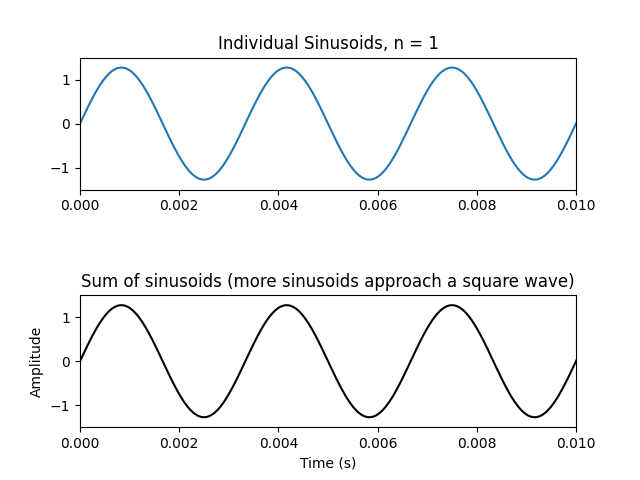

In [40]:
# Setting up the plots
fig, axes = plt.subplots(2,1)
fig.subplots_adjust(hspace=0.8)  # horizontal spacing

dt = 0.00001 # time spacing
t = np.arange(0,2,dt) # range of times to plot on x-axis
axes[0].set_ylabel('Amplitude', color='k')
axes[0].set_xlabel('Time (s)', color='k')
axes[0].xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
axes[0].set_xlim([0, 0.01])

sum_waves, = axes[1].plot([], [], 'k')
axes[1].set_ylabel('Amplitude', color='k')
axes[1].set_xlabel('Time (s)', color='k')
axes[1].xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
axes[1].set_title('Sum of sinusoids (more sinusoids approach a square wave)')
axes[1].set_xlim([0, 0.01])
axes[1].set_ylim([-1.5, 1.5])



# Create the interactive plot
def update(N = 1, f=300):
    
    axes[0].clear()
    axes[0].set_xlim([0, 0.01])
    axes[0].set_ylim([-1.5, 1.5])
    Y = np.zeros([len(t),N])

    for n in range(N):
        fo = (n+1)*f
        # These are the Fourier Series coefficients for a square wave
        # But you can change them to any other values you like to see what happens 
        # (There are specific values for the coefficients for different waveforms)
        an = 0
        bn = (2/((n+1)*np.pi))*(1-(-1)**(n+1)) 
        #
        Y[:,n] = an*np.cos(2*np.pi*fo*t) + bn*np.sin(2*np.pi*fo*t)
        axes[0].plot(t, Y[:,n])
        axes[0].set_title('Individual Sinusoids, n = '+str(n+1))

    Y_sum = np.sum(Y,axis=1)
    sum_waves.set_data(t, Y_sum)
    fig.canvas.draw_idle()

    IPython.display.display(Audio(Y_sum.T, rate=1/dt,normalize=True))


print('Move the slider to see how the parameters change the cosine and listen to the result. The sound you hear is the sum of the sinusoids.')
interact(update, N = (1,30,1), f=(100,1000,1));

### Complex Exponential Form of the Fourier Series

The Fourier series of a periodic signal, $f(t)$ can be expressed in an even more compact form using the complex exponentials (recall that we encountered in the [previous notebook](https://randyaliased.github.io/acspjbook/main/fundamental/03_Phasors.html)) as follows  

$\begin{equation}
	f(t) \approx \sum_{n=-\infty}^{\infty}c_n e^{jn\omega_0 t} 
\end{equation}$

Note that now we are summing from $-\infty$ to $+\infty$. The coefficient $c_n$ is a [phasor](https://randyaliased.github.io/acspjbook/main/fundamental/03_Phasors.html#what-is-a-phasor), i.e., a complex in [exponential form](https://randyaliased.github.io/acspjbook/main/fundamental/02_Complex_numbers.html#general-exponential-form) with some amplitude and phase. The coefficient, $c_n$ is related to the trigonometric form coefficients, $a_n$ and $b_n$ such that (try to prove this for yourself)

$\begin{align}
a_n &= c_n + c_{-n} \\
b_n &= j(c_n - c_{-n})
\end{align}$

Once again, once we have the coefficient, $c_n$, we can use the complex exponential form of the Fourier series to synthesize our periodic signal. This time however, the result will be complex-valued, but as we saw when we looked at phasors, simply taking the real or imaginary part will give us the waveform of interest. Compared to the trigonometric form, the advantage is that we only have one set of coefficients to compute. So how do we compute them?

Yet another integral, but only one! Here is the analysis equation for computing $c_n$ given $f(t)$:
$\begin{equation} 
	c_n =\frac{1}{T_0}\int_{t_0}^{t_0+T_0}f(t)e^{-jn\omega_0 t}\text{d}t
\end{equation}$

Hopefully it's starting to become evident why we like complex exponentials so much: Integrating (and differentiating) exponentials is really simple, and for complex exponentials, we treat the imaginary number, $j$ as a constant. Let's work out the square wave example again but using the complex exponential form.


### A square wave example using the complex exponential form

Let's consider again the previous square wave signal, $f(t)$. Recalling its mathematical expression:
$\begin{align}
	f(t) = \begin{cases} 1 &\text{for} \hspace{0.5cm}  0 < t \leq T_0/2 \\ 
                          -1 & \text{for} \hspace{0.5cm}  T_0/2 < t \leq T_0 \\  \end{cases}
\end{align}$

Now let's apply the analysis equation for the complex exponential form of the Fourier series to compute $c_n$ (I've left out the missing steps for you to try the integral, *a hint: you will encounter expressions such as $e^{-jn \pi}$. How can this be simplified?* ):

$\begin{align}
    c_n&=\frac{1}{T_0}\left\{\int_{0}^{T_0/2}(1)e^{-jn\omega_0 t}\text{d}t+
    \int_{T_0/2}^{T_0}(-1)e^{-jn\omega_0 t}\text{d}t\right\}\\
    &=\frac{1}{j n\pi}\left(1-(-1)^n\right)=
    	\begin{cases}\frac{2}{j n\pi} & n~~\text{odd}\\ 0 &  n~~\text{even}\end{cases}
\end{align}$

We can also write $c_n$ as a phasor, $c_{n} = \frac{2}{n\pi}e^{-j \pi/2}$, where the modulus is $\frac{2}{n\pi}$ (when $n$ is odd) and the argument is $-\pi/2$. As with the trigonometric form, we also find that only odd-integered sinusoidal components are relevant for the square wave. 

The complex exponential Fourier series is then finally given by

$\begin{equation}
    f(t) \approx \sum_{\substack{n=-\infty \\n~odd }}^{\infty} \frac{2}{n\pi}e^{-j \pi/2} e^{jn\omega_0 t}
\end{equation}$


Let's consider two terms from this series for $n=+1$ and $n=+3$ and let's run the same animation as we did in phasors when [adding sine waves of different frequencies](https://randyaliased.github.io/acspjbook/main/fundamental/03_Phasors.html#adding-sinusoids-with-different-frequencies). What we can observe is that we can geometrically interpret of each of these complex exponential Fourier series terms as these rotating vectors. Note that because we have only chosen the terms for positive values of $n$, the vectors rotate in an anti-clockwise manner, whereas if we were to use negative values of $n$, the vectors would rotate in an anti-clockwise direction. From the animation, you can also see that the amplitude of the square wave oscillates around 0.5 as opposed to 1. This is because we have only used positive values of $n$.

In [89]:
# Define the 1st phasor - you can change A1, f1, and theta1
A1 = 2/np.pi
theta1 = -np.pi/2
f1 = 1
omega_1 = 2*np.pi*f1
z1_phasor = A1*np.exp(1j*theta1) 

# Define the 2nd phasor - you can change A1, f1, and theta1
A2 = 1/np.pi
theta2 = -np.pi/2
f2 = 3
omega_2 = 2*np.pi*f2
z2_phasor = A2*np.exp(1j*theta2) 

z_sum = z1_phasor + z2_phasor
z_sum_modulus = np.abs(z_sum)

T = np.abs(1/(f1))  # period (we use the absolute value in case the freq. is negative)
Np = 2              # number of periods
dt = 0.01
t = np.arange(0,Np*T,dt) # time
N_frames =  len(t)

# Define the complex sinusoids
z1_compsin = z1_phasor*np.exp(1j*omega_1*t) 
z2_compsin = z2_phasor*np.exp(1j*omega_2*t)
z3_compsin = z1_compsin + z2_compsin




xylims = 1
# Unit circle
xO,yO = (0,0)  # origin
UnitCircle = patches.Circle((0.0, 0.0), radius=1,edgecolor="black",facecolor="none",alpha=0.2)

# SEtting up plots - we need to include a few more lines for the various plots.
fig4, axes = plt.subplots(1,2,figsize=(10,4))

axes[0].add_patch(UnitCircle) 
axes[0].plot(xO,yO,'k+')

# freq 1
line_mainstem, = axes[0].plot([], [],color='orange',linestyle='--',lw=1)
line_mainpt, = axes[0].plot([], [], color='orange', marker='o',lw=1)
line_mainstem_cos, = axes[0].plot([], [], 'orange',lw=1)
line_mainpt_cos, = axes[0].plot([], [], 'orange',marker='d',lw=1)

# freq 2
line2_mainstem, = axes[0].plot([], [],color='green',linestyle='--',lw=1)
line2_mainpt, = axes[0].plot([], [], color='green', marker='o',lw=1)
line2_mainstem_cos, = axes[0].plot([], [], 'green',lw=1)
line2_mainpt_cos, = axes[0].plot([], [], 'green',marker='d',lw=1)

# sum
line3_mainstem, = axes[0].plot([], [],'k--',lw=1,alpha=0.3)
line3_mainpt, = axes[0].plot([], [], color='brown', marker='o',lw=1)
line3_mainstem_cos, = axes[0].plot([], [], 'brown',lw=1)
line3_mainpt_cos, = axes[0].plot([], [], 'brown',marker='d',lw=1)

line4_mainstem, = axes[0].plot([], [],'brown',lw=2,alpha=1)

#%
# time_text = axes[0].text(0.02, 0.95, '', transform=ax1.transAxes)
time_text = axes[0].text(1, 1.05, '', transform=axes[0].transAxes)
axes[0].set_title('$f_{1}$ = '+str(f1)+'Hz,  $f_{2}$ = '+str(f2)+'Hz')
axes[0].grid(color='lightgrey',alpha=0.4)
axes[0].set_aspect('equal')

max_amp = np.max([A1,A2,z_sum_modulus]) # see what's the maximum amplitude to scale axes accordingly
axes[0].set_xlim([-xylims, xylims])
axes[0].set_ylim([-xylims, xylims])


line_cos, = axes[1].plot([], [], 'orange',lw=1,label='$\cos(2\pi$'+str(f1)+'t + '+str(np.round(theta1,decimals=2))+')')
line_cospt, = axes[1].plot([], [], 'orange',marker='d',lw=1)
# additional lines for additional terms
line2_cos, = axes[1].plot([], [], 'green',lw=1,label='$\cos(2\pi$'+str(f2)+'t + '+str(np.round(theta2,decimals=2))+')')
line2_cospt, = axes[1].plot([], [], 'green',marker='d',lw=1)
line3_cos, = axes[1].plot([], [], 'brown',lw=2,label='Sum')
line3_cospt, = axes[1].plot([], [], 'brown',marker='d',lw=1)


axes[1].set_xlabel('Time [s]')
axes[1].set_ylabel('Amplitude')
axes[1].set_xlim(0,2)
axes[1].set_ylim(-1,1)

axes[1].grid(color='lightgrey',alpha=0.4)
axes[1].axhline(y=0, color='lightgrey',alpha=0.8)
axes[1].set_ylim([-xylims, xylims])
axes[1].legend(loc='upper right')


    
def animate(i): 
        
    # For phasor 1

    x = np.real(z1_compsin[i])
    y = np.imag(z1_compsin[i])

    line_mainstem.set_data([xO, x],[yO, y])
    line_mainpt.set_data([x,x],[y,y])
    line_mainstem_cos.set_data([xO, x],[0, 0])
    line_mainpt_cos.set_data([x,x],[0,0])
    
    # cosine waves    
    line_cos.set_data(t[0:i+1],np.real(z1_compsin[0:i+1]))
    line_cospt.set_data([t[i],t[i]],[x,x])
    

    # For phasor 2
    x2 = np.real(z2_compsin[i])
    y2 = np.imag(z2_compsin[i])
    line2_mainstem.set_data([xO+x, x2+x],[yO+y, y2+y])
    line2_mainstem_cos.set_data([xO+x, x2+x],[0, 0])
    line2_mainpt_cos.set_data([x2+x,x2+x],[0,0])

    # cosine waves    
    line2_cos.set_data(t[0:i+1],np.real(z2_compsin[0:i+1]))
    line2_cospt.set_data([t[i], t[i]],[x2+x, x2+x])
    
    
    # For the sum
    x3 = np.real(z3_compsin[i])
    y3 = np.imag(z3_compsin[i])
    line3_mainpt.set_data([x3,x3],[y3,y3])
    line3_mainstem_cos.set_data([xO, x3],[0, 0])
    line3_mainpt_cos.set_data([x3,x3],[0,0])

    time_text.set_text('t = '+str(np.round(t[i],decimals=2))+' s')
    
    # cosine waves    
    line3_cos.set_data(t[0:i+1],  np.real(z3_compsin[0:i+1]))
    line3_cospt.set_data([t[i],t[i]],[x3,x3])
    line4_mainstem.set_data((A1*np.cos(omega_1*t[0:i+1] + theta1) + A2*np.cos(omega_2*t[0:i+1] + theta2) ),(A1*np.sin(omega_1*t[0:i+1] + theta1) + A2*np.sin(omega_2*t[0:i+1] + theta2) ))
    
    

anim = animation.FuncAnimation(fig4, animate, frames=N_frames, interval=40, blit=True) # this calls the function to do the animation

plt.close(fig4)
HTML(controls_css + anim.to_jshtml())

### From the Fourier Series to the Fourier Transform

Considering the following signal defined over one period as follows:


$\begin{equation}
f(t) = \begin{cases}
 1 & |t| < T_{p} \\
 0 & T_{p} < t < T_{o}/2 \\
 \end{cases}
\end{equation}$

and periodically repeating with period T_{o}. This is a sort of pulse-train type signal. Let's plot it.


See how the signal changes as we increase the period:


interactive(children=(FloatSlider(value=2.0, description='To', max=20.0, min=2.0), Output()), _dom_classes=('w…

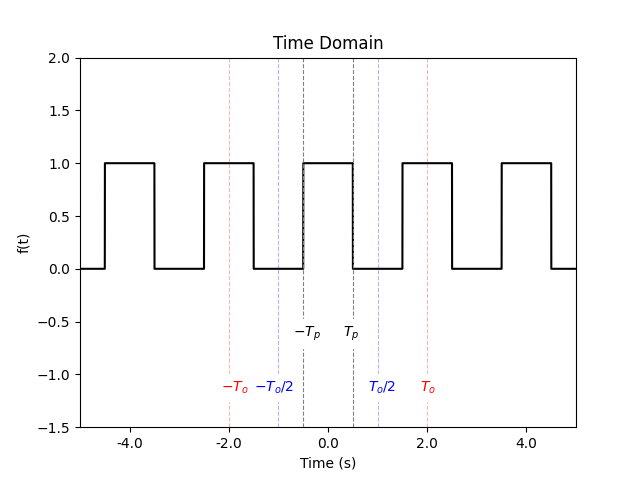

In [5]:
# Let's plot the periodic signal - taken from here: https://stackoverflow.com/questions/29698213/rectangular-pulse-train-in-python


def rect(Tp):
    """ a function to return a centered rectangular pulse of width Tp """
    return lambda t: (-Tp <= t) & (t < Tp)

def pulse_train(t, at, shape):
    """create a train of pulses over t at times at and shape """
    return np.sum(shape(t - at[:,np.newaxis]), axis=0)


Tp = 0.5 # Pulse Width
To = 2

fig, axes = plt.subplots()
plt.subplots_adjust(hspace=0.7)

# Time domain plots

dt = 0.0001 # time spacing
t = np.arange(-5*To, 5*To, dt) # Range of times to plot 
line, = axes.plot([], [], 'k')
vline = axes.axvline(To, color='red', linestyle='--', linewidth=0.8,alpha=0.3)  # Draw horizontal line at y=0
vline2 = axes.axvline(-To, color='red', linestyle='--', linewidth=0.8,alpha=0.3)  # Draw horizontal line at y=0
label1 = axes.text(To-0.2, -1.2, '$T_{o}$', color='red', ha='left', va='bottom', backgroundcolor='white')
label2 = axes.text(-To-0.2, -1.2, '$-T_{o}$', color='red', ha='left', va='bottom', backgroundcolor='white')

vline3 = axes.axvline(To/2, color='blue', linestyle='--', linewidth=0.8, alpha=0.3)  # Draw horizontal line at y=0
vline4 = axes.axvline(-(To/2), color='blue', linestyle='--', linewidth=0.8, alpha=0.3)  # Draw horizontal line at y=0
label3 = axes.text((To/2)-0.2, -1.2, '$T_{o}/2$', color='blue', ha='left', va='bottom', backgroundcolor='white')
label4 = axes.text(-(To/2)-0.5, -1.2, '$-T_{o}/2$', color='blue', ha='left', va='bottom', backgroundcolor='white')

vline5 = axes.axvline(Tp, color='grey', linestyle='--', linewidth=0.8)  # Draw horizontal line at y=0
vline6 = axes.axvline(-Tp, color='grey', linestyle='--', linewidth=0.8)  # Draw horizontal line at y=0

label5 = axes.text(Tp-0.2, -0.7, '$T_{p}$', color='black',  ha='left', va='bottom', backgroundcolor='white')
label6 = axes.text(-Tp-0.2, -0.7, '$-T_{p}$', color='black', ha='left', va='bottom', backgroundcolor='white')


axes.set_ylabel('f(t)', color='k')
axes.set_xlabel('Time (s)', color='k')
axes.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
axes.set_xlim([-5, 5])
axes.set_ylim([-1.5, 2])
axes.set_title('Time Domain', color='k')




def update(To = 2):
    
    # Time domain plots
    
    y = pulse_train(t=t,at=np.arange(-5*To, 5*To, To),shape=rect(Tp))
    fig.canvas.draw_idle()
    line.set_data(t, y)
    
    vline.set_xdata([To, To])
    vline2.set_xdata([-To, -To])
    label1.set_x(To-0.15)
    label2.set_x(-To-0.15)
    vline3.set_xdata([To/2, To/2])
    vline4.set_xdata([-To/2, -To/2])
    label3.set_x((To/2)-0.2)
    label4.set_x(-(To/2)-0.5)
    
    
    

print('See how the signal changes as we increase the period:')
interact(update, To = (2,20,0.1)); 



In [ ]:
Tp = 0.5 # Pulse Width

fig, axes = plt.subplots(2,1)
plt.subplots_adjust(hspace=0.7)

# Time domain plots

dt = 0.0001 # time spacing
t = np.arange(-5*To, 5*To, dt) # Range of times to plot 
line, = axes[0].plot([], [], 'k')
vline = axes[0].axvline(To, color='red', linestyle='--', linewidth=0.8,alpha=0.3)  # Draw horizontal line at y=0
vline2 = axes[0].axvline(-To, color='red', linestyle='--', linewidth=0.8,alpha=0.3)  # Draw horizontal line at y=0
label1 = axes[0].text(To-0.2, -1.2, '$T_{o}$', color='red', ha='left', va='bottom', backgroundcolor='white')
label2 = axes[0].text(-To-0.2, -1.2, '$-T_{o}$', color='red', ha='left', va='bottom', backgroundcolor='white')

vline3 = axes[0].axvline(To/2, color='blue', linestyle='--', linewidth=0.8, alpha=0.3)  # Draw horizontal line at y=0
vline4 = axes[0].axvline(-(To/2), color='blue', linestyle='--', linewidth=0.8, alpha=0.3)  # Draw horizontal line at y=0
label3 = axes[0].text((To/2)-0.2, -1.2, '$T_{o}/2$', color='blue', ha='left', va='bottom', backgroundcolor='white')
label4 = axes[0].text(-(To/2)-0.5, -1.2, '$-T_{o}/2$', color='blue', ha='left', va='bottom', backgroundcolor='white')

vline5 = axes[0].axvline(Tp, color='grey', linestyle='--', linewidth=0.8)  # Draw horizontal line at y=0
vline6 = axes[0].axvline(-Tp, color='grey', linestyle='--', linewidth=0.8)  # Draw horizontal line at y=0

label5 = axes[0].text(Tp-0.2, -0.7, '$T_{p}$', color='black',  ha='left', va='bottom', backgroundcolor='white')
label6 = axes[0].text(-Tp-0.2, -0.7, '$-T_{p}$', color='black', ha='left', va='bottom', backgroundcolor='white')


axes[0].set_ylabel('f(t)', color='k')
axes[0].set_xlabel('Time (s)', color='k')
axes[0].xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
axes[0].set_xlim([-5, 5])
axes[0].set_ylim([-1.5, 2])
axes[0].set_title('Time Domain', color='k')


# Freq domain plots

f_int = np.arange(-100, 101, 1) # Range of integer frequencies to plot
T_ak = np.zeros(len(f_int))

markers, = axes[1].plot([],[], ls="none", marker="o")
baseline = axes[1].axhline(0, color="grey")

verts=np.c_[f_int, np.zeros_like(f_int), f_int, T_ak].reshape(len(T_ak),2,2)
col = collections.LineCollection(verts)
axes[1].add_collection(col)


line_Freq, = axes[1].plot([], [], 'b')
axes[1].set_xlim([-2*4*np.pi, 2*4*np.pi])
axes[1].set_ylim([-0.5, 1.2])
axes[1].set_ylabel('$T_o  c_n$', color='k')
axes[1].set_xlabel('$\omega$ (rad/s)', color='k')
axes[1].set_title('Frequency Domain', color='k')

def update(To = 2):
    
    # Time domain plots
    
    y = pulse_train(t=t,at=np.arange(-5*To, 5*To, To),shape=rect(Tp))
    fig.canvas.draw_idle()
    line.set_data(t, y)
    
    vline.set_xdata([To, To])
    vline2.set_xdata([-To, -To])
    label1.set_x(To-0.15)
    label2.set_x(-To-0.15)
    vline3.set_xdata([To/2, To/2])
    vline4.set_xdata([-To/2, -To/2])
    label3.set_x((To/2)-0.2)
    label4.set_x(-(To/2)-0.5)
    
    
    # Frequency Domain plots
    wo = (2*np.pi)/To
    
    for n in range(len(f_int)):
        k = f_int[n]
        if k == 0:
            T_ak[n] = (2*Tp)
        else:
            T_ak[n] = (2*np.sin(k*wo*Tp))/(k*wo)
    
    markers.set_data(f_int*wo, T_ak)
    verts=np.c_[f_int*wo, np.zeros_like(f_int*wo), f_int*wo, T_ak].reshape(len(f_int*wo),2,2)
    col.set_segments(verts)
        

print('See how the signal changes as we increase the period:')
interact(update, To = (2,20,0.1)); 



In [ ]:
Tp = 0.5 # Pulse Width

fig, axes = plt.subplots(2,1)
plt.subplots_adjust(hspace=0.7)

# Time domain plots

dt = 0.0001 # time spacing
t = np.arange(-5*To, 5*To, dt) # Range of times to plot 
line, = axes[0].plot([], [], 'k')
axes[0].set_ylabel('f(t)', color='k')
axes[0].set_xlabel('Time (s)', color='k')
axes[0].xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
axes[0].set_xlim([-5, 5])
axes[0].set_ylim([-1.5, 2])
axes[0].set_title('Time Domain', color='k')


# Freq domain plots

f_int = np.arange(-100, 101, 1) # Range of integer frequencies to plot
T_ak = np.zeros(len(f_int))

markers, = axes[1].plot([],[], ls="none", marker="o")
baseline = axes[1].axhline(0, color="grey")


line_Freq, = axes[1].plot([], [], 'b')
axes[1].set_xlim([-2*4*np.pi, 2*4*np.pi])
axes[1].set_ylim([-0.7, 4])
axes[1].set_ylabel('$T_o  c_n$', color='k')
axes[1].set_xlabel('$\omega$ (rad/s)', color='k')
axes[1].set_title('Frequency Domain', color='k')

def update(Tp = 0.5):
    
    # Time domain plots
    To = 20
    
    y = pulse_train(t=t,at=np.arange(-5*To, 5*To, To),shape=rect(Tp))
    fig.canvas.draw_idle()
    line.set_data(t, y)
    
    # Frequency Domain plots
    wo = (2*np.pi)/To
    
    for n in range(len(f_int)):
        k = f_int[n]
        if k == 0:
            T_ak[n] = (2*Tp)
        else:
            T_ak[n] = (2*np.sin(k*wo*Tp))/(k*wo)

    line_Freq.set_data(f_int*wo, T_ak)
    

print('See how the spectrum changes as we compress/expand signal:')
interact(update, Tp = (0.5,2,0.1)); 

